In [1]:
import os
import json
import re
import math
import datetime

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

from skimage.io import imread, imsave
from skimage.transform import warp
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter, find_peaks
import scipy.stats as stats
from scipy.stats import gaussian_kde
from scipy.integrate import odeint, solve_ivp
from numba import njit, prange
from skimage.filters import gaussian
from scipy.ndimage import uniform_filter1d
from numpy.polynomial import Polynomial
from sklearn.metrics import r2_score

In [2]:
def plot_quivers(images, pos, vel, w, h, tf, normed=False):
    for t in range(tf):
        print(t)
        im = images[t]
        fig, ax = plt.subplots()
        #ax.imshow(im / np.max(im), cmap='gray')#, origin='upper', extent=[w, 0, h, 0])
        ax.imshow(im, cmap='gray')#, origin='upper', extent=[w, 0, h, 0])
        
        #plt.imshow(im/np.max(im),cmap='gray')#, origin='lower')
        if normed:
            norm = np.sqrt(vel[:,:,t,0]**2 + vel[:,:,t,1]**2)
        else:
            norm = 1
        vx = vel[:,:,t,0]
        vy = vel[:,:,t,1]


        ax.quiver(w/2+pos[:,:,t,1],h/2+pos[:,:,t,0], vy/norm, -vx/norm,cmap='gray')
        # Remove axis labels and ticks
        ax.set_xticks([])
        ax.set_yticks([])
        ax.axis('off')        
        plt.tight_layout()
        plt.savefig(f'Quivers/quiver_{t}.png', bbox_inches='tight', pad_inches=0)
        plt.show()

#### Example quiver

In [3]:
exp_sum = pd.read_excel('../Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
exp_sum

,Date,Machine,Strain,DNA,Chemical,Dilution,formatted_dates
0,2023-11-15,Ti scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-5),2023_11_15
1,2023-11-15,Tweez scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-6),2023_11_15
2,2023-11-17,Ti scope,DHL708,pLPT119&pLPT41,-,10^(-5),2023_11_17
3,2023-11-17,Tweez scope,MC4100 & DHL708,pLPT119&pLPT41,-,10^(-6),2023_11_17
4,2023-11-28,Ti scope,MC4100 & MG1655,pAAA,-,10^(-6),2023_11_28
5,2023-11-28,Tweez scope,MG1655,pAAA,-,10^(-5),2023_11_28
6,2023-11-30,Ti scope,MC4100,pAAA,-,10^(-6),2023_11_30
7,2023-11-30,Tweez scope,MC4100,pAAA,-,10^(-5),2023_11_30
8,2023-12-04,Ti scope,MC4100,pLPT107&pLPT41,IPTG,10^(-6),2023_12_04
9,2023-12-04,Tweez scope,MC4100,pLPT107&pLPT41,IPTG,10^(-5),2023_12_04


In [4]:
path_ext = '/media/guillermo/Expansion/Thesis GY/3. Analyzed files'
folder_results = 'results'
folder_velocity = 'velocity_data'
exp_date = '2023_11_30'
vector = 'pAAA'
scope_name = 'Ti scope'
pos = 0
scopes = {'Tweez scope': 'TiTweez', 'Ti scope': 'Ti'}
dnas = {'pLPT20&pLPT41': 'pLPT20&41', 'pLPT119&pLPT41': 'pLPT119&41', 'pAAA': 'pAAA', 'pLPT107&pLPT41': 'pLPT107&41'}

path_scope = os.path.join(path_ext, scope_name)
path = os.path.join(path_scope, exp_date)
path_results = os.path.join(path,folder_results, f"pos{pos}")
path_velocity = os.path.join(path,folder_velocity, f"pos{pos}")
fname = f'{exp_date}_10x_1.0x_{dnas[vector]}_{scopes[scope_name]}_Pos{pos}.ome.tif'
fname

'2023_11_30_10x_1.0x_pAAA_Ti_Pos0.ome.tif'

In [5]:
if vector == 'pLPT20&pLPT41' or vector == 'pLPT119&pLPT41':
    yfp_chn = 0
    cfp_chn = 1
    ph_chn = 2
    fluo_chns = 2
else:
    rfp_chn = 0
    yfp_chn = 1
    cfp_chn = 2
    ph_chn = 3
    fluo_chns = 3

In [6]:
im_all = imread(os.path.join(path,fname))

In [7]:
pos = np.load(os.path.join(path_velocity,'pos.np.npy'))
vel = np.load(os.path.join(path_velocity,'vel.np.npy'))

0


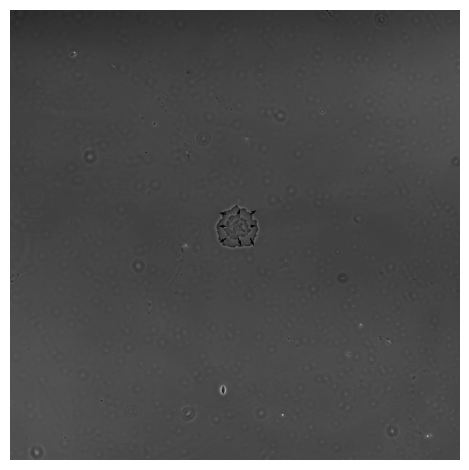

1


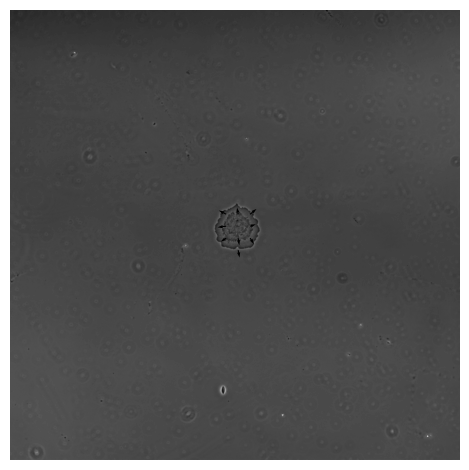

2


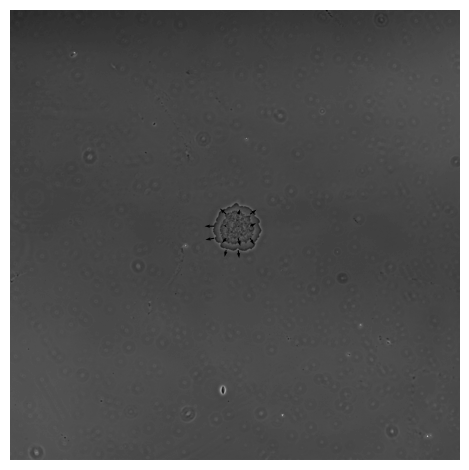

3


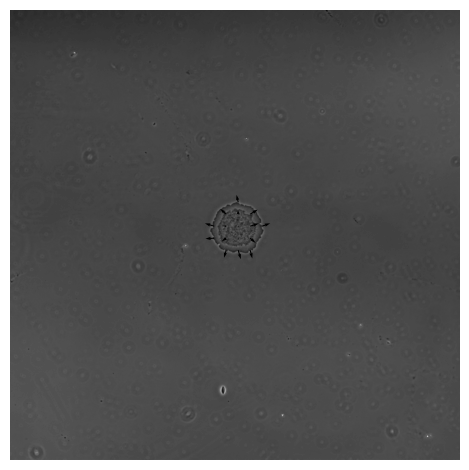

4


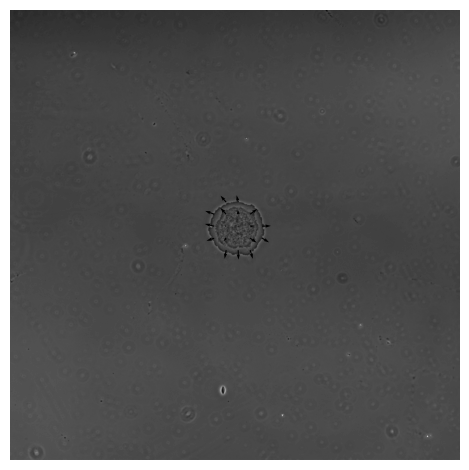

5


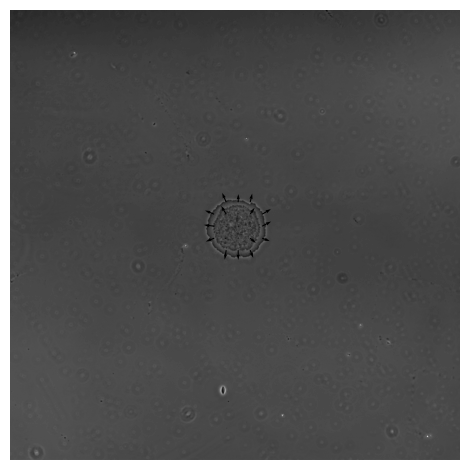

6


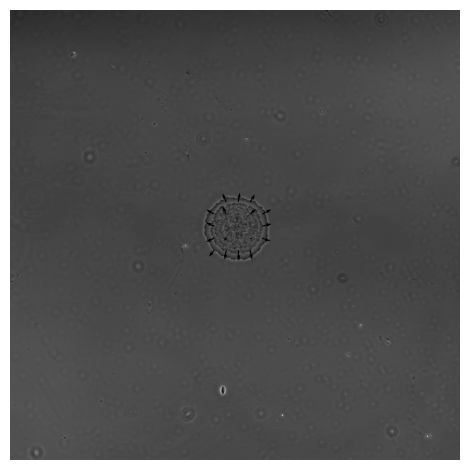

7


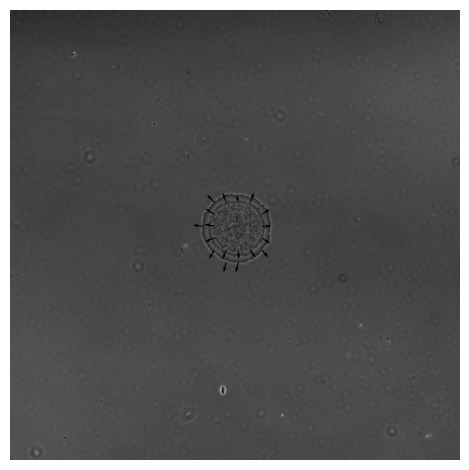

8


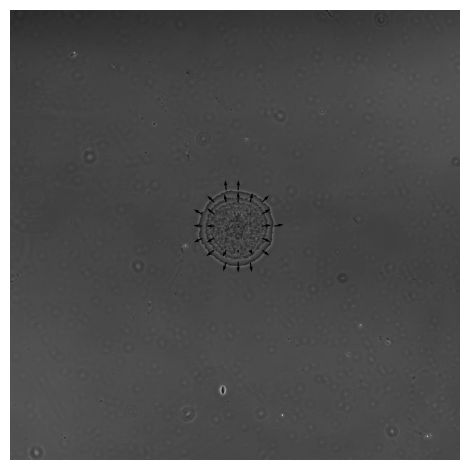

9


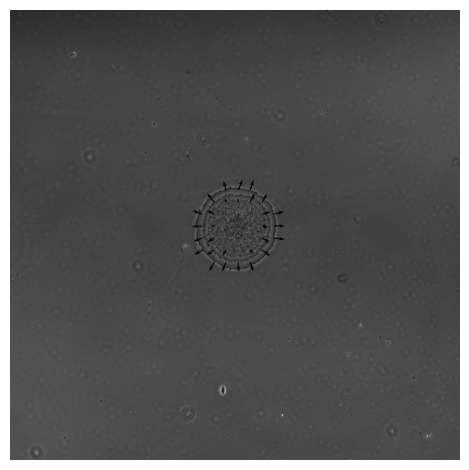

10


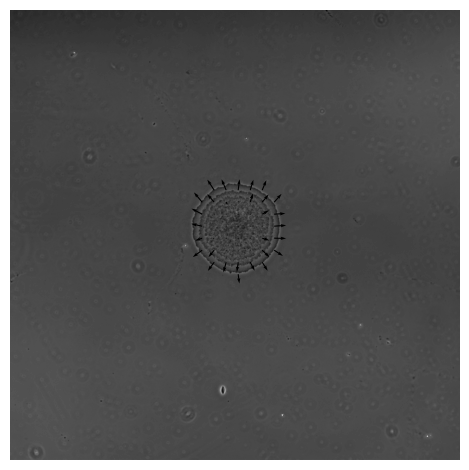

11


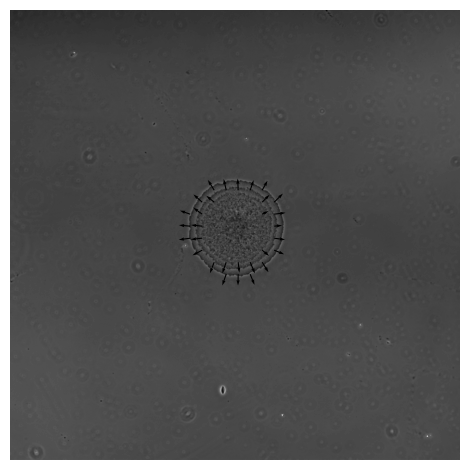

12


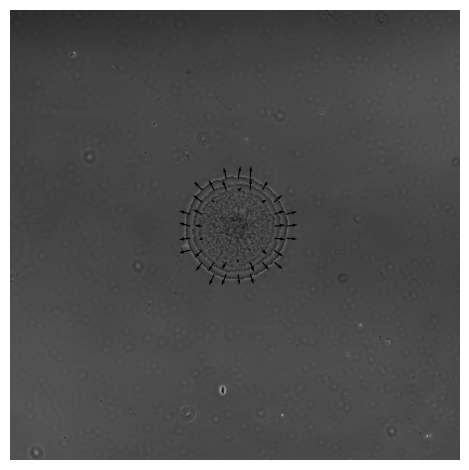

13


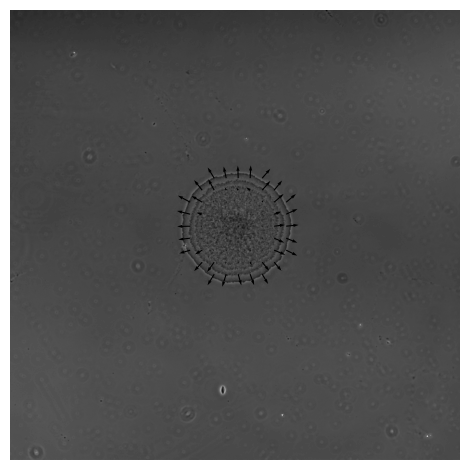

14


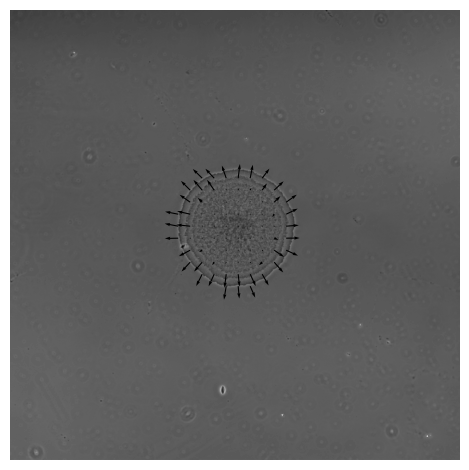

15


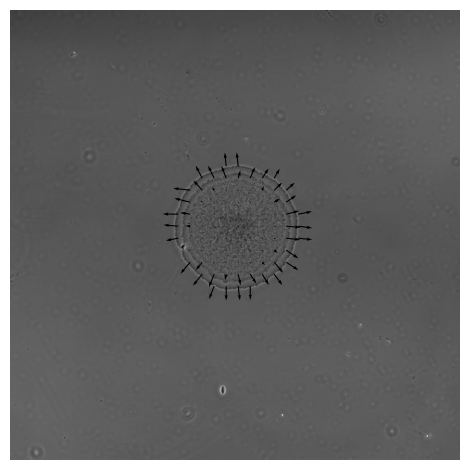

16


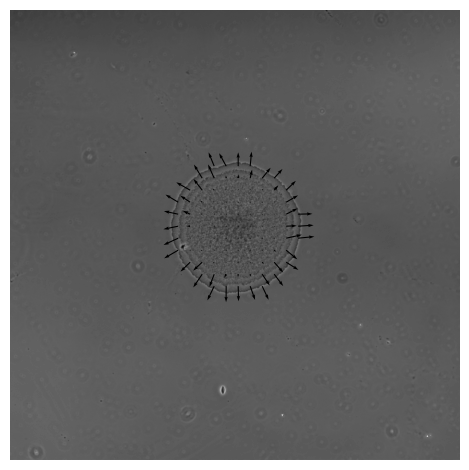

17


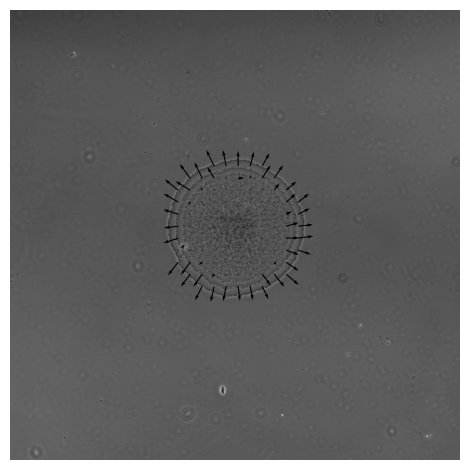

18


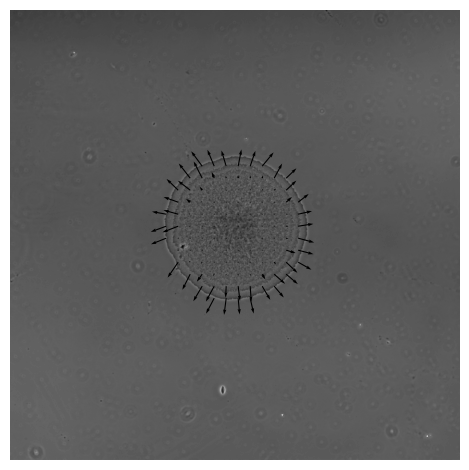

19


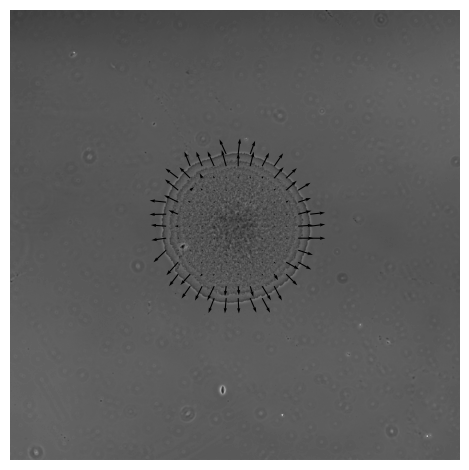

20


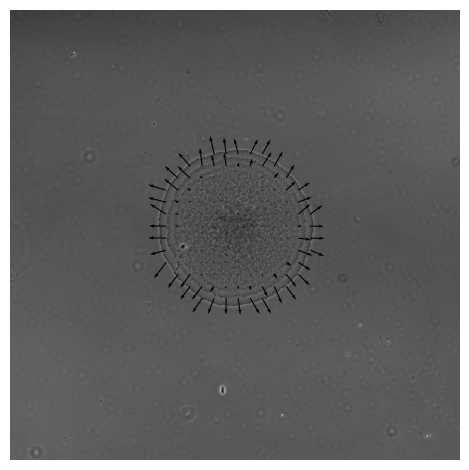

21


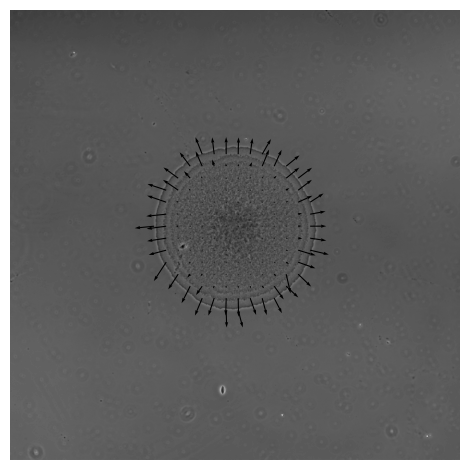

22


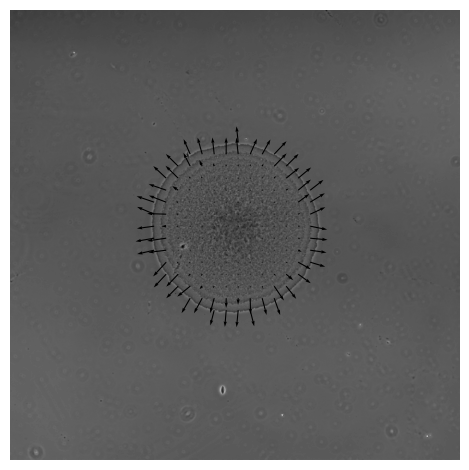

23


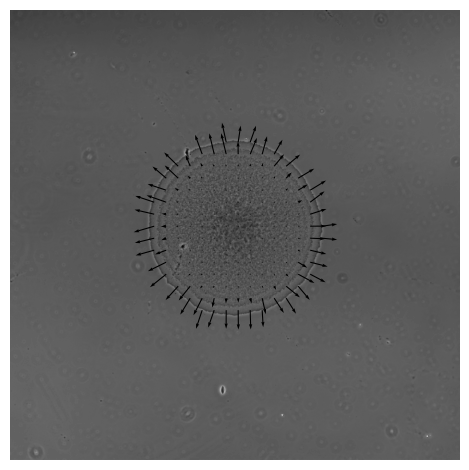

24


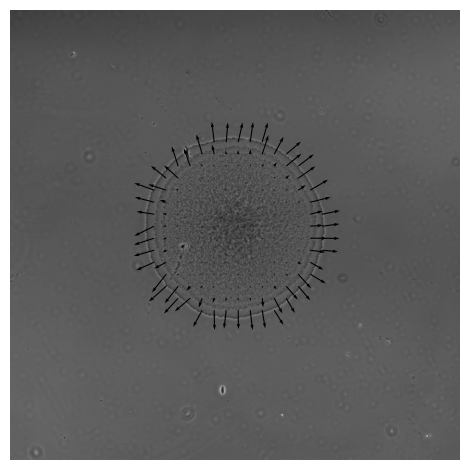

25


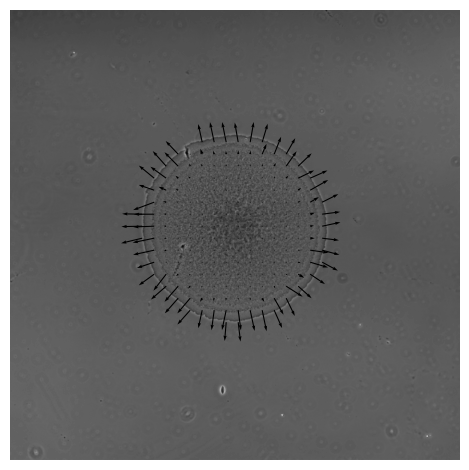

26


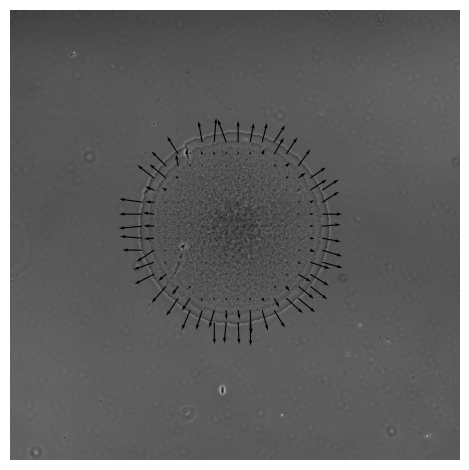

27


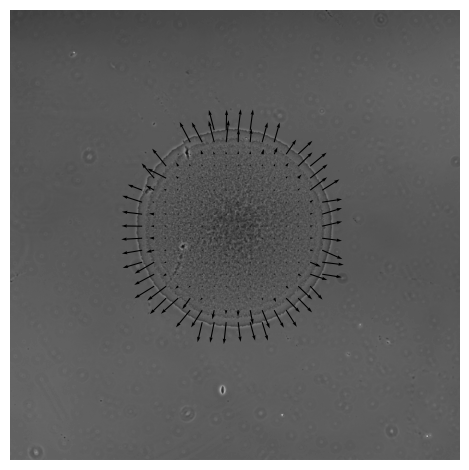

28


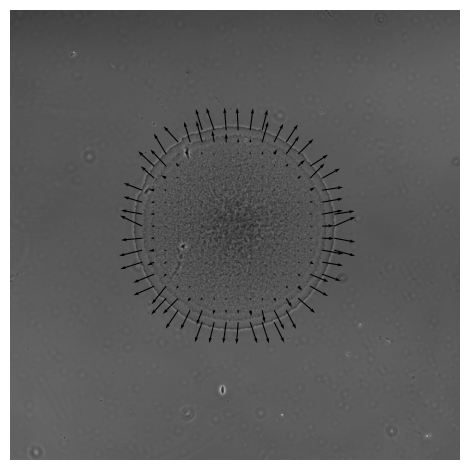

29


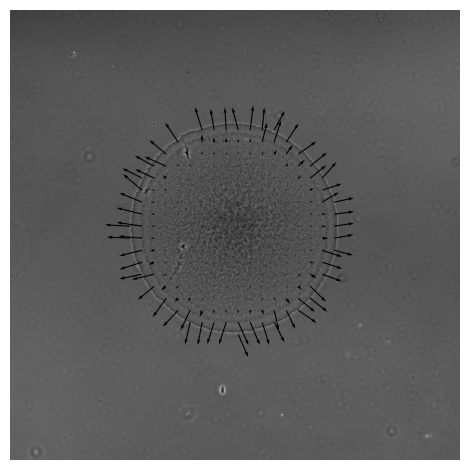

30


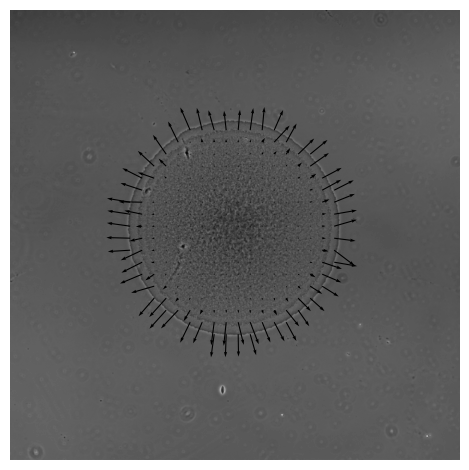

31


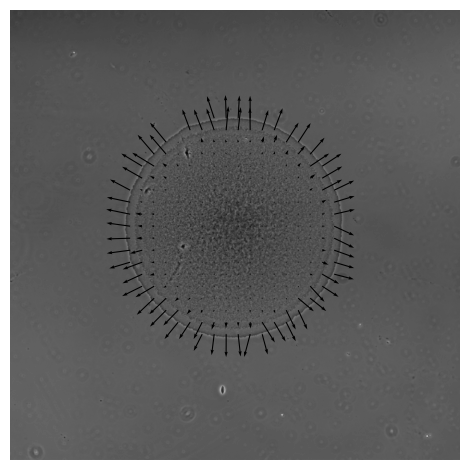

32


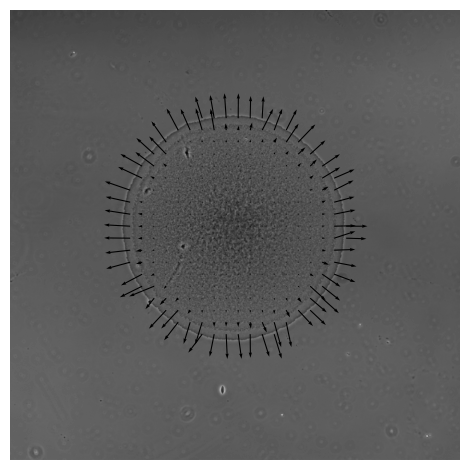

33


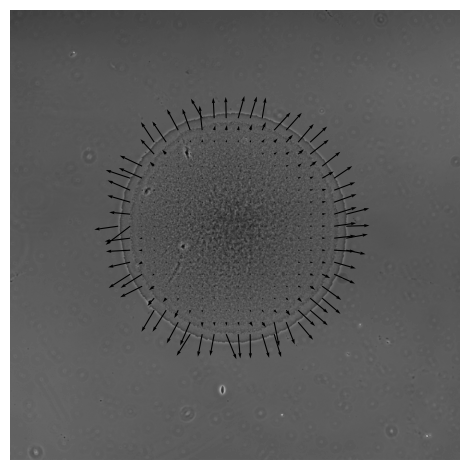

34


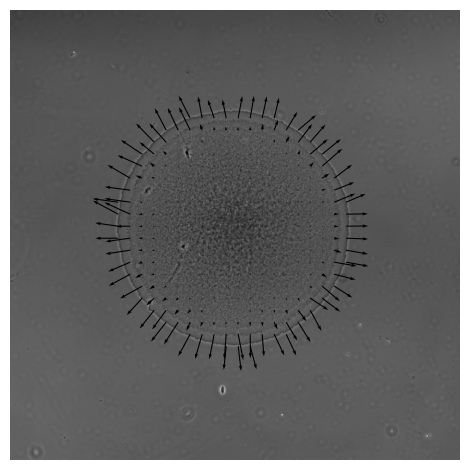

35


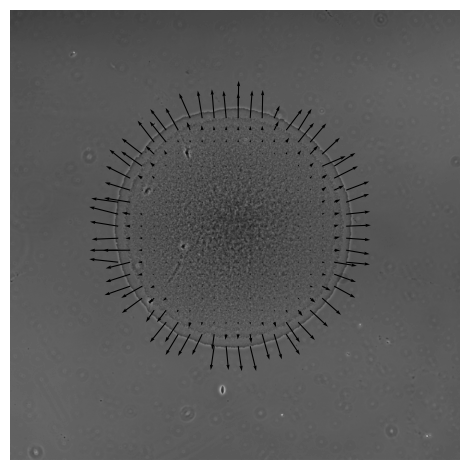

36


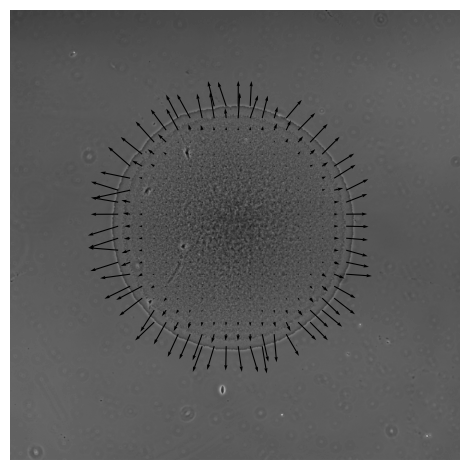

37


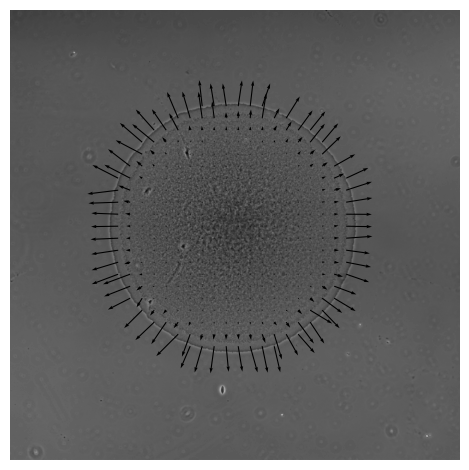

38


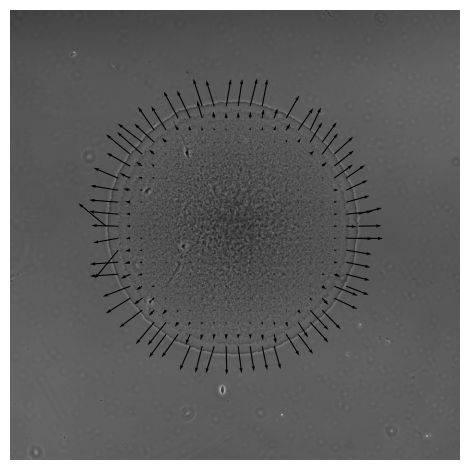

39


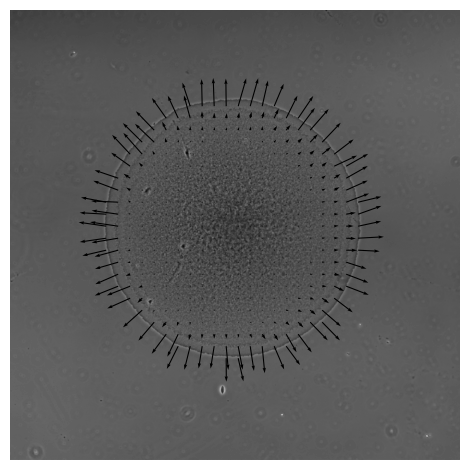

40


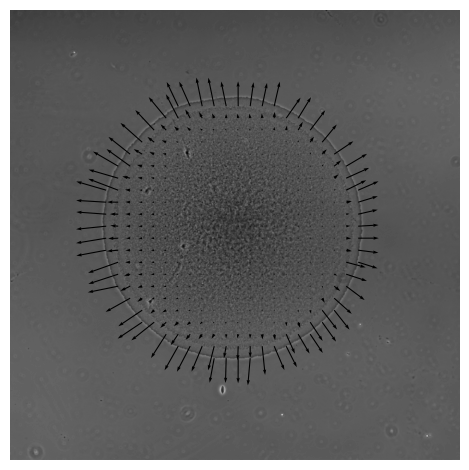

41


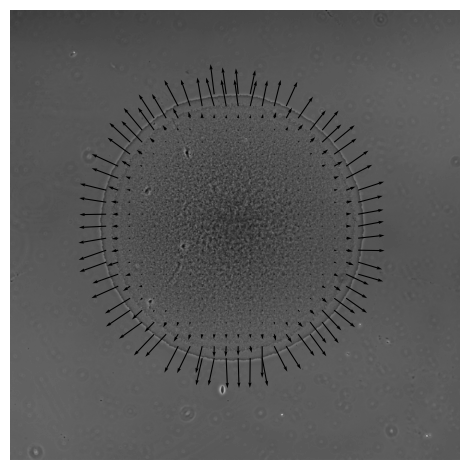

42


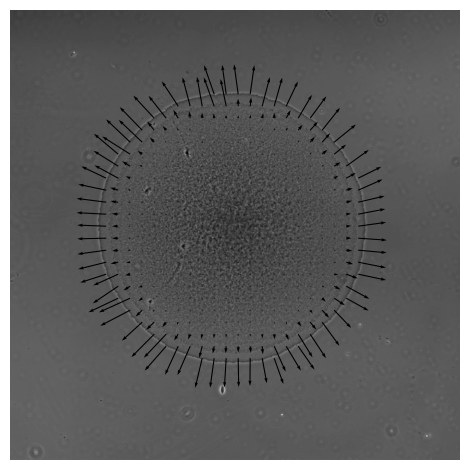

43


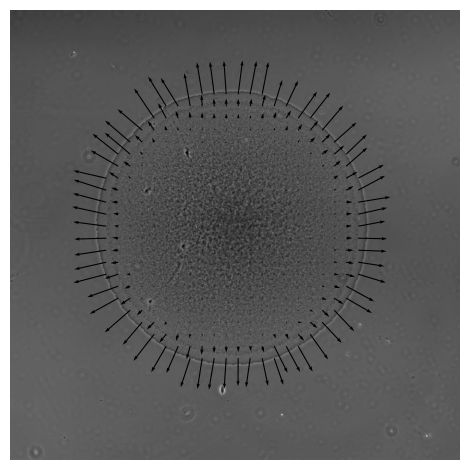

44


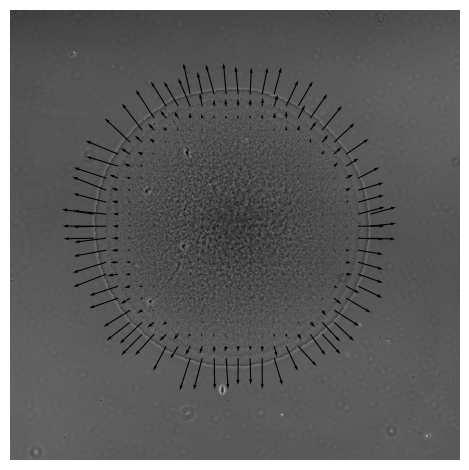

45


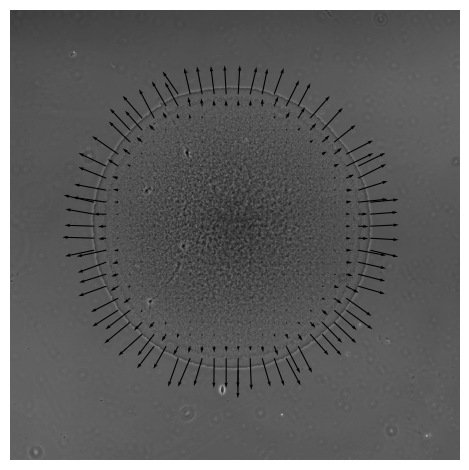

46


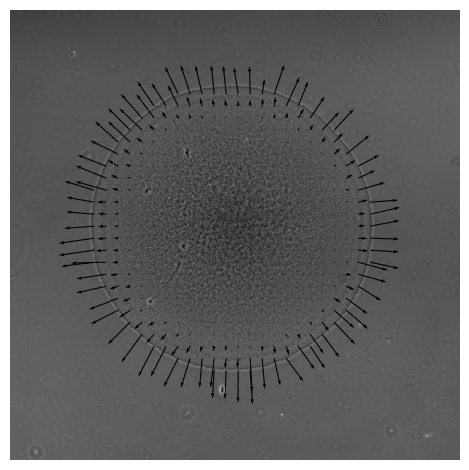

47


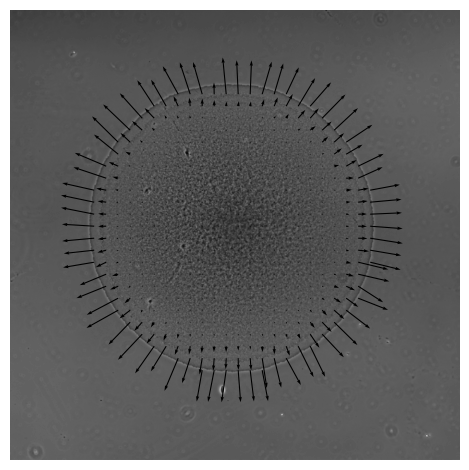

48


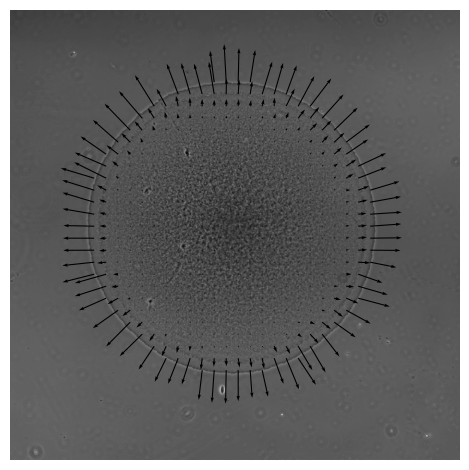

49


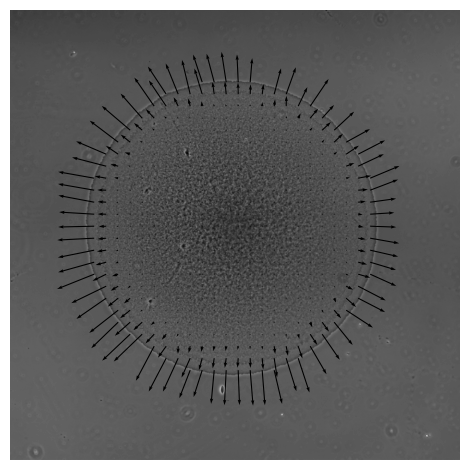

50


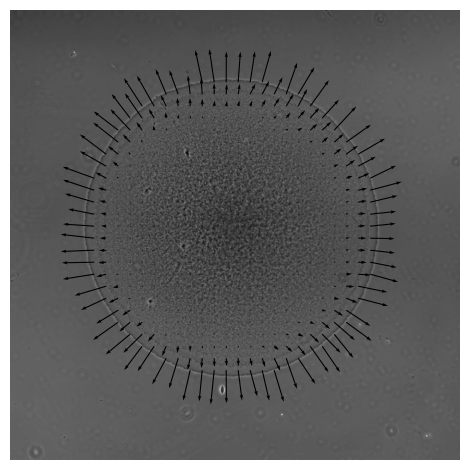

51


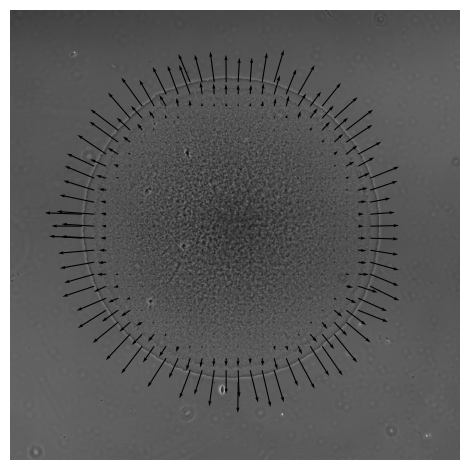

52


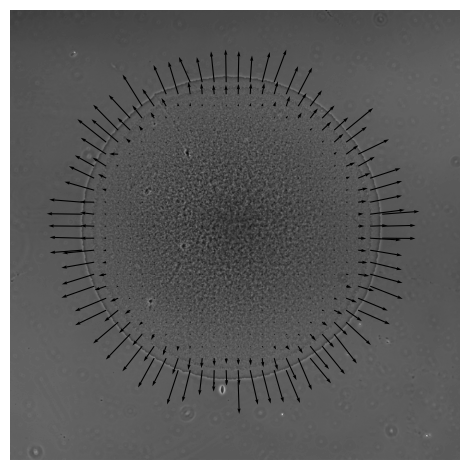

53


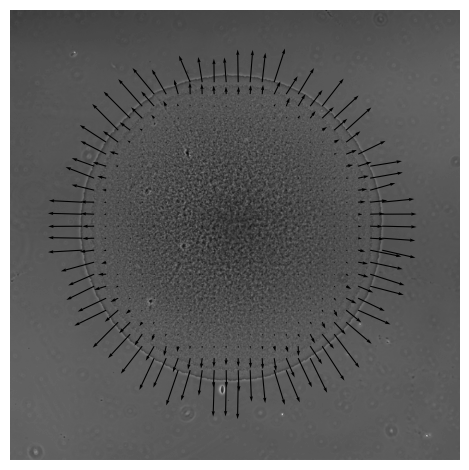

54


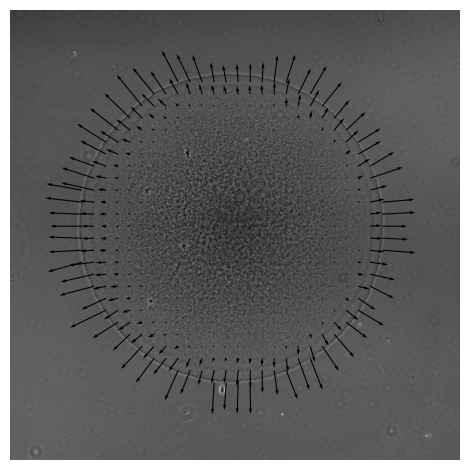

55


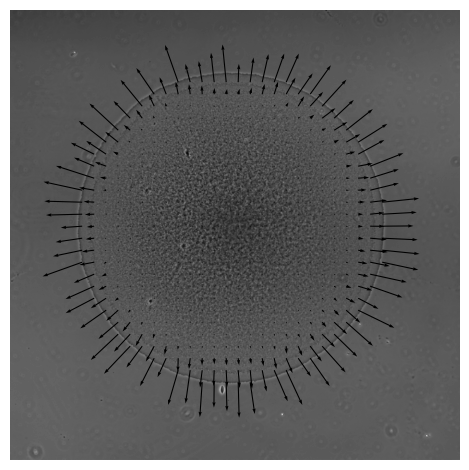

56


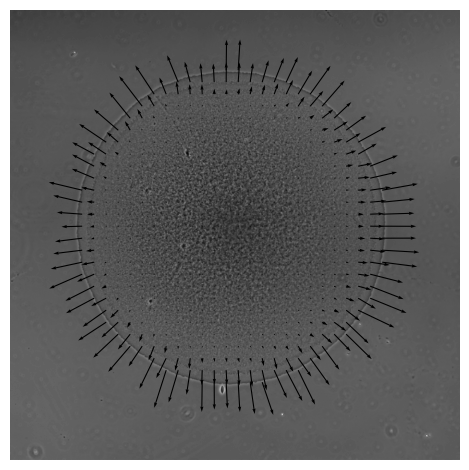

57


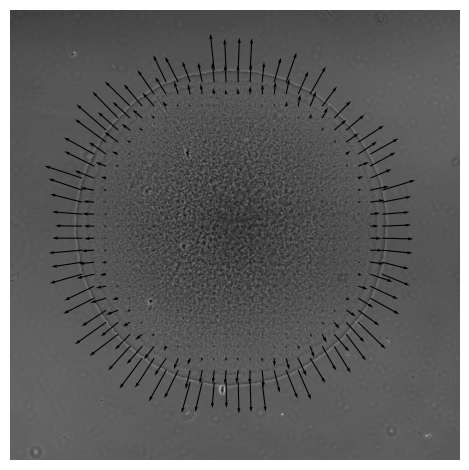

58


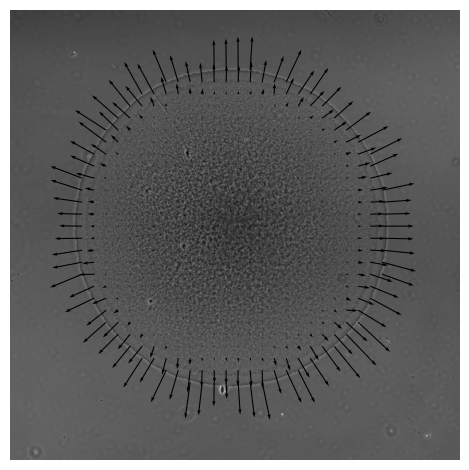

59


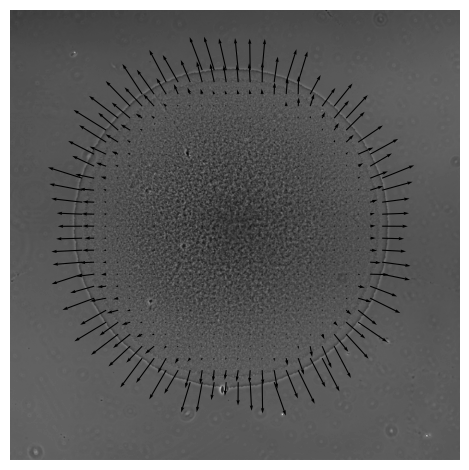

60


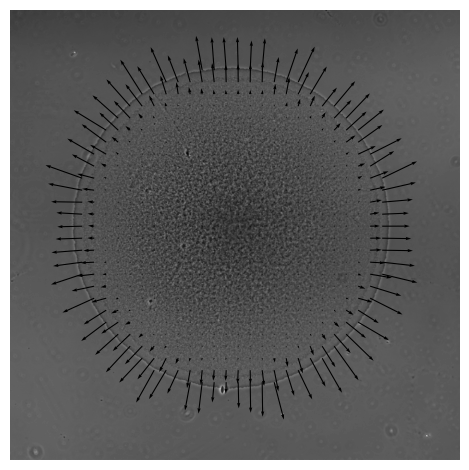

61


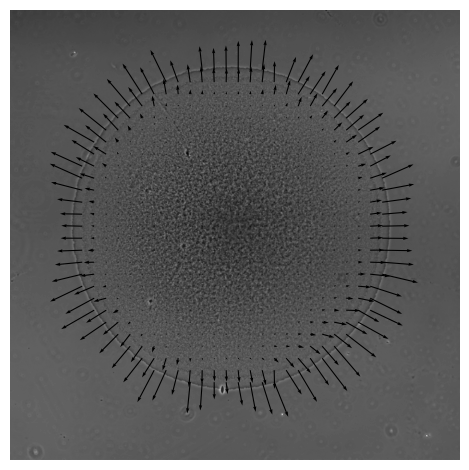

62


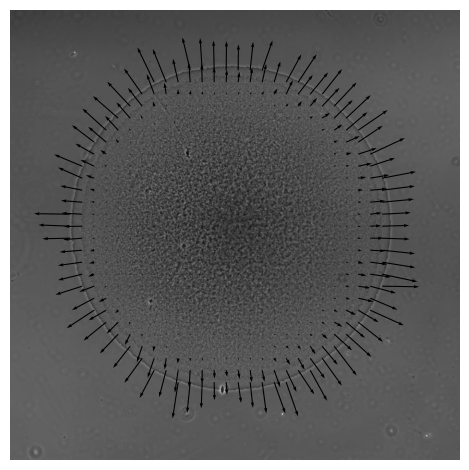

63


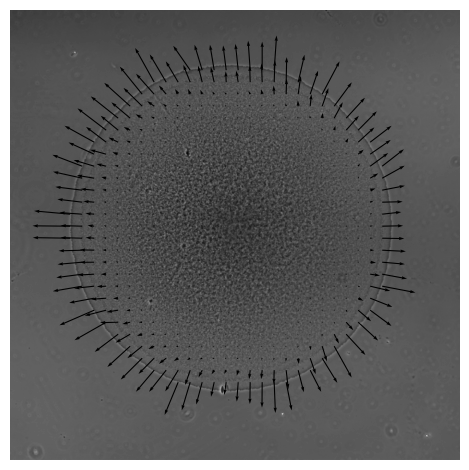

64


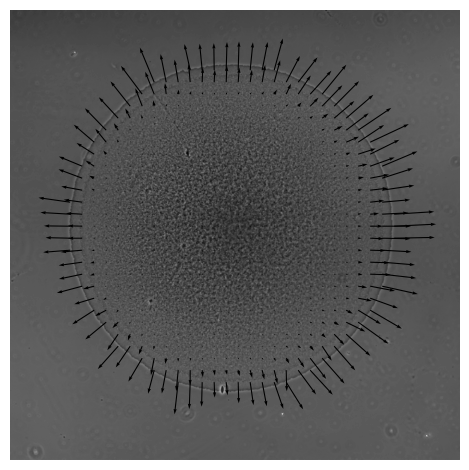

65


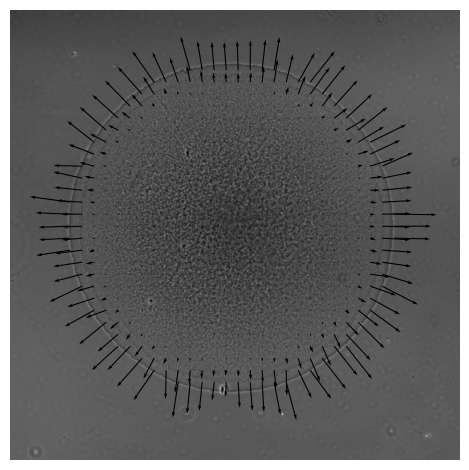

66


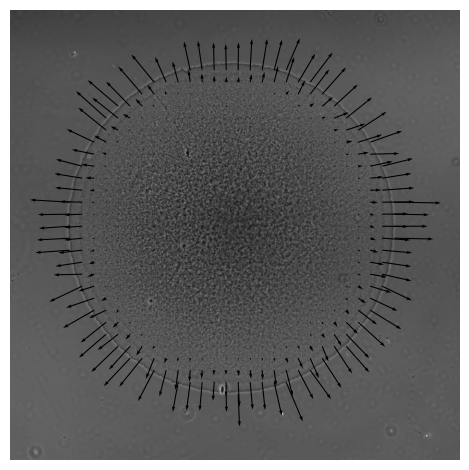

67


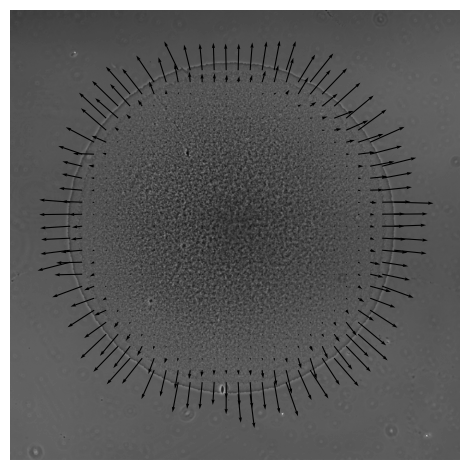

In [8]:
plot_quivers(im_all[:,:,:,ph_chn], pos, vel, 64, 64, 68, normed=False)

In [6]:
exp_sum

,Date,Machine,Strain,DNA,Chemical,Dilution,formatted_dates
0,2023-11-15,Ti scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-5),2023_11_15
1,2023-11-15,Tweez scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-6),2023_11_15
2,2023-11-17,Ti scope,DHL708,pLPT119&pLPT41,-,10^(-5),2023_11_17
3,2023-11-17,Tweez scope,MC4100 & DHL708,pLPT119&pLPT41,-,10^(-6),2023_11_17
4,2023-11-28,Ti scope,MC4100 & MG1655,pAAA,-,10^(-6),2023_11_28
5,2023-11-28,Tweez scope,MG1655,pAAA,-,10^(-5),2023_11_28
6,2023-11-30,Ti scope,MC4100,pAAA,-,10^(-6),2023_11_30
7,2023-11-30,Tweez scope,MC4100,pAAA,-,10^(-5),2023_11_30
8,2023-12-04,Ti scope,MC4100,pLPT107&pLPT41,IPTG,10^(-6),2023_12_04
9,2023-12-04,Tweez scope,MC4100,pLPT107&pLPT41,IPTG,10^(-5),2023_12_04


In [7]:
df = pd.read_excel('../data_processed.xlsx')
for i in [6]:    
    exp_date = exp_sum.loc[i,'formatted_dates']
    vector = exp_sum.loc[i,'DNA']
    scope_name = exp_sum.loc[i,'Machine']
    path_scope = os.path.join(path_ext, scope_name)
    path = os.path.join(path_scope, exp_date)
    
    df_pos = df[(df.Date == exp_sum.loc[i, 'Date']) & 
        (df.DNA == vector) & 
        (df.Machine == scope_name)]
    poss = df_pos.Position.unique()
    for pos in [0]:
        incub = df_pos[df_pos.Position == pos]['incub_time'].values[0]
        

In [8]:
start_minutes = 373
increments = [100, 200, 300, 400, 500, 600]

# Generate the time points
time_points = [(datetime.datetime(1, 1, 1, 0, 0) + datetime.timedelta(minutes=start_minutes + inc)).strftime("%H:%M") for inc in increments]

print(time_points)

['07:53', '09:33', '11:13', '12:53', '14:33', '16:13']


#### Model versus velocimetry

In [9]:
exp_sum = pd.read_excel('../Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
positions = pd.read_excel('../Positions.xlsx')
df = pd.read_excel('../data_processed.xlsx')

#### Single position

#### Model prediction vs data at different time points

In [10]:
#nt, nx, ny, nc = im_all.shape
start_frame = 0
t0 = 10
tf = 68
step = 1

vmag = np.load(os.path.join(path_results, 'vmag.npy'))
vmag = vmag[t0:tf, :, :]
nt, nx, ny = vmag.shape
vfront = np.load(os.path.join(path_results, 'vfront.npy'))
rmax = np.load(os.path.join(path_results, 'radius.npy'))
idx = np.arange(start_frame+t0,nt+start_frame+t0)
vfront = vfront[idx]
rmax = rmax[idx]
svmag = np.load(os.path.join(path_results, 'svmag.npy'))
edt = np.load(os.path.join(path_results, 'edt.npy'))
edt = edt[idx, :, :]
r0 = np.load(os.path.join(path_results, 'r0.npy'))

/tmp/ipykernel_136433/824414082.py:25: RuntimeWarning: invalid value encountered in scalar divide
  model_vmag = B * (((R - r - r0) * np.exp(-r / r0) + r0 * np.exp(-R / r0)) / (R - r))
/tmp/ipykernel_136433/824414082.py:26: RuntimeWarning: Mean of empty slice
  mean_model_vmag = np.nanmean(model_vmag)


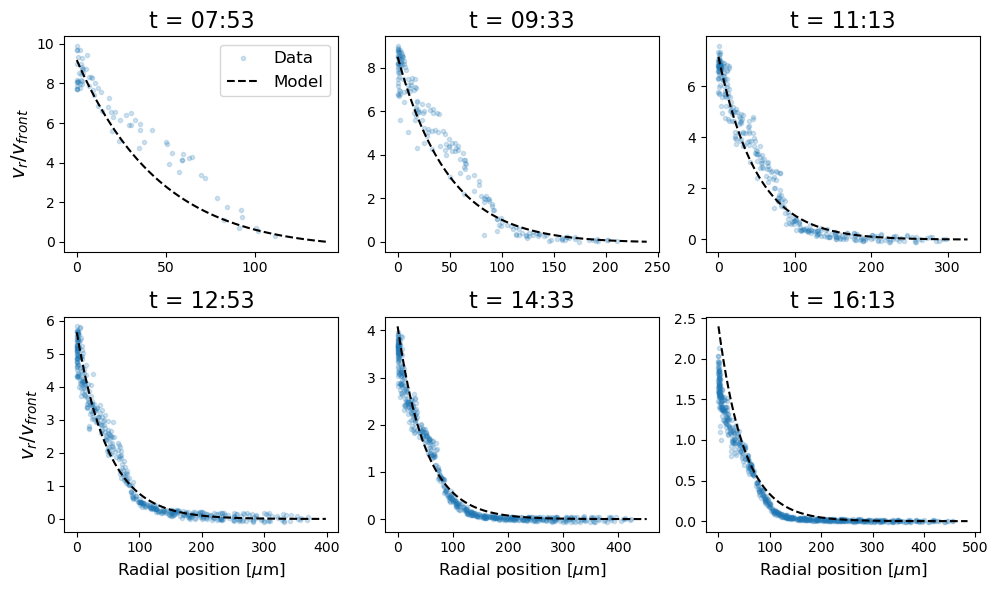

In [24]:
# Make a plot to see how good the fit is
i = 0
step = 1
times = [0,10,20,30,40,50]#np.linspace(0, nt - 1, 12).astype(int)  # [0,int(nt/3),int(2*nt/3),nt-1]
plt.figure(figsize=(10,6))
for t in times:
    plt.subplot(2, 3, i + 1)
    x_model = np.zeros((0,))
    y_model = np.zeros((0,))
    x_data = np.zeros((0,))
    y_data = np.zeros((0,))

    for ix in range(nx):
        for iy in range(ny):
            if not np.isnan(svmag[t, ix, iy]):
                r = edt[t, ix * 32:ix * 32 + 64, iy * 32:iy * 32 + 64]
                #r = edt[t, ix * 16:ix * 16 + 32, iy * 16:iy * 16 + 32]
                x_data = np.append(x_data, np.nanmean(r))
                y_data = np.append(y_data, svmag[t, ix, iy])
    plt.plot(x_data*1.14, y_data, '.', alpha=0.2)  # , color=colours[i])

    for r in np.linspace(0, rmax[t], 100):
        R = rmax[t]
        B = R / ((R - r0) + r0 * np.exp(-R / r0))    
        model_vmag = B * (((R - r - r0) * np.exp(-r / r0) + r0 * np.exp(-R / r0)) / (R - r))
        mean_model_vmag = np.nanmean(model_vmag)
        x_model = np.append(x_model, np.nanmean(r))
        y_model = np.append(y_model, vfront[step * t] * mean_model_vmag)

    #plt.plot(x_model, y_model, 'k--')  # , color=colours[i])
    plt.plot(x_model*1.14, y_model, 'k--')  # , color=colours[i])


    #plt.title(f't = {idx[t]}')
    plt.title(f't = {time_points[i]}', fontsize=16)
    if i == 0 or i == 3:
        plt.ylabel('$v_r/v_{front}$', fontsize=14)
    if i == 3 or i == 4 or i == 5:
        plt.xlabel('Radial position [$\mu$m]', fontsize=12)
    if i==0:
        plt.legend(['Data', 'Model'], fontsize=12)
    i += 1
plt.tight_layout()
plt.savefig('vfront_rad.png', dpi=300)
plt.show()

#### Model prediction vs data

In [27]:
exp_sum = pd.read_excel('../Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
positions = pd.read_excel('../Positions.xlsx')
df = pd.read_excel('../data_processed.xlsx')

In [28]:
y_model = np.array([])
y_data = np.array([])
for i in [6]:    
    exp_date = exp_sum.loc[i,'formatted_dates']
    vector = exp_sum.loc[i,'DNA']
    scope_name = exp_sum.loc[i,'Machine']
    path_scope = os.path.join(path_ext, scope_name)
    path = os.path.join(path_scope, exp_date)
    
    df_pos = df[(df.Date == exp_sum.loc[i, 'Date']) & 
        (df.DNA == vector) & 
        (df.Machine == scope_name)]
    poss = df_pos.Position.unique()

    for pos in [0]:
        #if df_pos.loc[col,'r0'] > 1:
        path_results = os.path.join(path, folder_results, f"pos{pos}")
        y_model = np.load(os.path.join(path_results, 'y_model.npy'))
        y_data = np.load(os.path.join(path_results, 'y_data.npy'))

In [29]:
np.corrcoef(y_model, y_data)

array([[1.        , 0.98024346],
       [0.98024346, 1.        ]])

In [30]:
r_squared = r2_score(y_data, y_model)
print("R^2:", r_squared)

R^2: 0.957203165512001


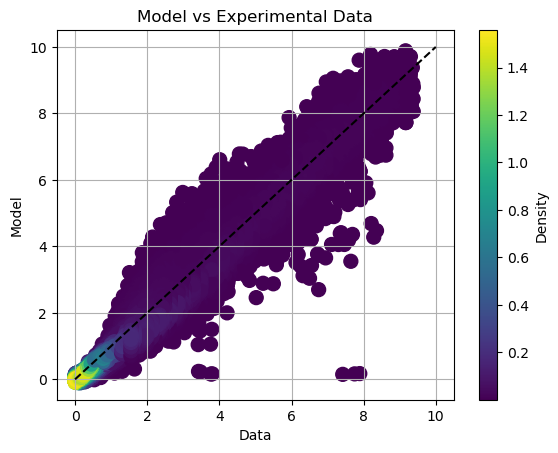

In [100]:
"""
y = y_data
x = y_model
xy = np.vstack([x,y])
z = gaussian_kde(xy)(xy)
fig, ax = plt.subplots()
scatter = ax.scatter(x, y, c=z, s=100, cmap='viridis')
plt.plot(np.arange(0, 11), np.arange(0, 11), 'k--')
plt.colorbar(scatter, label='Density')
plt.title('Model vs Experimental Data')
plt.xlabel('Data')
plt.ylabel('Model')
plt.grid(True)
plt.savefig('')
plt.show()
"""

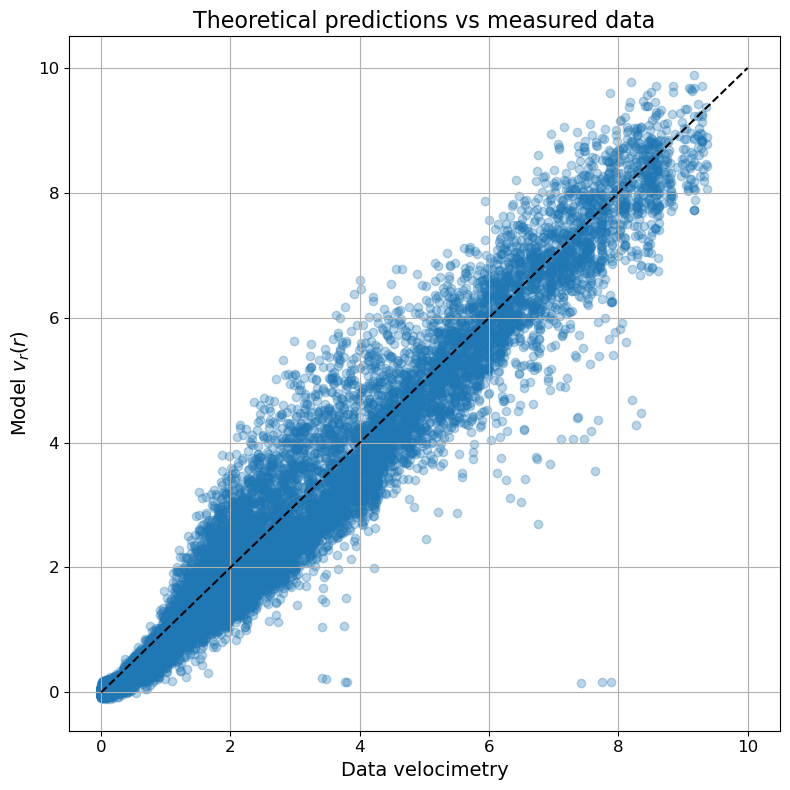

In [16]:
fig, ax = plt.subplots(figsize=(8,8))
scatter = ax.scatter(x, y, alpha=0.3)
plt.plot(np.arange(0,11), np.arange(0,11), 'k--')
plt.title('Theoretical predictions vs measured data', fontsize=16)
plt.xlabel('Data velocimetry', fontsize=14)
plt.ylabel('Model $v_r(r)$', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig('model_vs_velocimetry.png', dpi=300)
plt.show()

#### All positions

In [17]:
y_models = np.array([])
y_datas = np.array([])
for i in exp_sum.index.values:    
    exp_date = exp_sum.loc[i,'formatted_dates']
    vector = exp_sum.loc[i,'DNA']
    scope_name = exp_sum.loc[i,'Machine']
    path_scope = os.path.join(path_ext, scope_name)
    path = os.path.join(path_scope, exp_date)
    
    df_pos = df[(df.Date == exp_sum.loc[i, 'Date']) & 
        (df.DNA == vector) & 
        (df.Machine == scope_name)]
    #poss = df_pos.Position.unique()

    for col in df_pos.index.values:
        if df_pos.loc[col,'r0'] > 1:
            path_results = os.path.join(path, folder_results, f"pos{df_pos.loc[col,'Position']}")
            y_model = np.load(os.path.join(path_results, 'y_model.npy'))
            y_data = np.load(os.path.join(path_results, 'y_data.npy'))
            y_models = np.concatenate((y_models, y_model))
            y_datas = np.concatenate((y_datas, y_data))
np.corrcoef(y_models,y_datas)

array([[1.       , 0.9592881],
       [0.9592881, 1.       ]])

In [22]:
np.corrcoef(y_models,y_datas)


array([[1.        , 0.96095162],
       [0.96095162, 1.        ]])

In [23]:
r_squared = r2_score(y_datas, y_models)
print("R^2:", r_squared)

R^2: 0.9125823693124734


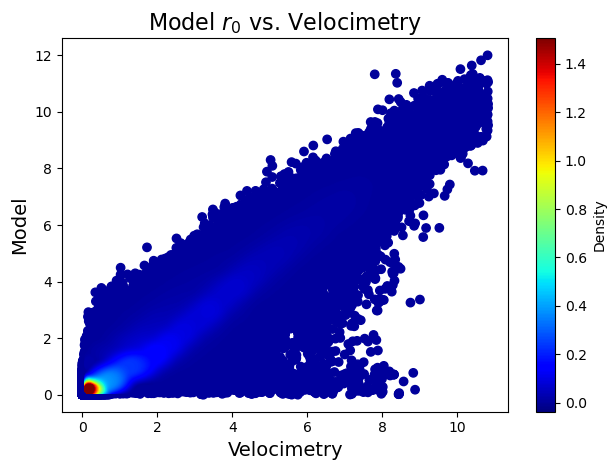

In [129]:
from matplotlib import cm
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn

bins = [30, 30]
y = y_datas[y_datas > 0]
x = y_models[y_datas > 0]
fig, ax = plt.subplots()
data, x_e, y_e = np.histogram2d(x, y, bins=bins, density=True)
z = interpn((0.5 * (x_e[1:] + x_e[:-1]), 0.5 * (y_e[1:] + y_e[:-1])), data, np.vstack([x, y]).T, method="splinef2d", bounds_error=False)

# To be sure to plot all data
z[np.where(np.isnan(z))] = 0.0

# Sort the points by density, so that the densest points are plotted last
idx = z.argsort()
x, y, z = x[idx], y[idx], z[idx]

# Scatter plot
sc = ax.scatter(x, y, c=z, cmap='jet')

# Colorbar
norm = Normalize(vmin=np.min(z), vmax=np.max(z))
cbar = fig.colorbar(cm.ScalarMappable(norm=norm, cmap='jet'), ax=ax)
cbar.ax.set_ylabel('Density')

# Add title and labels
ax.set_title('Model vs Velocimetry', fontsize=16)
ax.set_title('Model $r_0$ vs. Velocimetry', fontsize=16)
ax.set_xlabel('Velocimetry', fontsize=14)
ax.set_ylabel('Model', fontsize=14)

# Show plot
plt.tight_layout()
plt.savefig('model_vs_velocimetry.png', dpi=300)
plt.show()

#### Histogram of r0

In [78]:
exp_sum = pd.read_excel('../Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
positions = pd.read_excel('../Positions.xlsx')
df = pd.read_excel('../data_processed.xlsx')

In [79]:
df_r0 = df[df.r0 > 0.1]
idx = df[df.r0 > 0.1].index
area = df['area_max_um'][idx]
radius = np.sqrt(area/np.pi)
r0 = df_r0['r0']

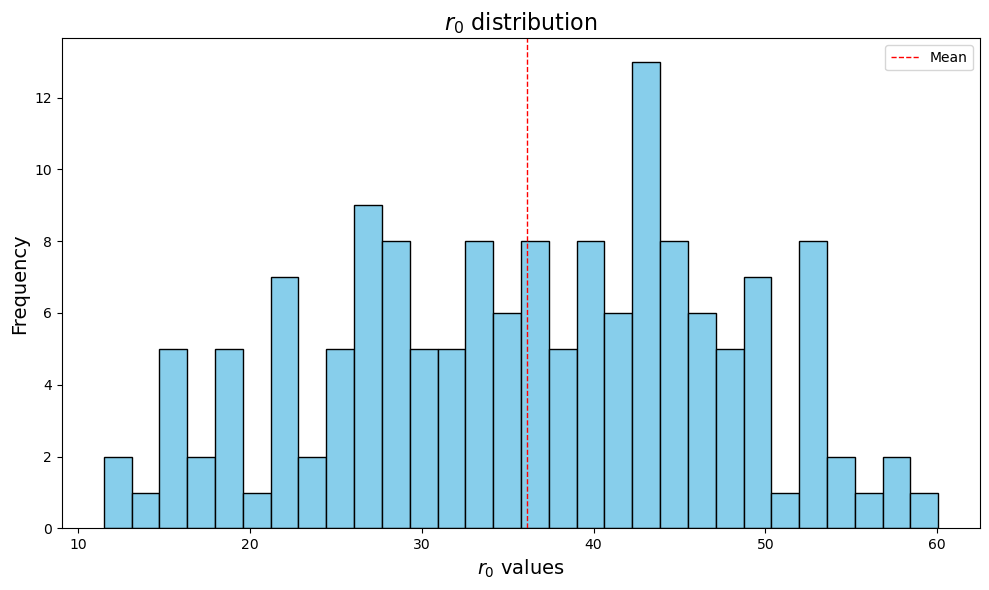

In [106]:
data = df_r0['r0']
# Create a histogram
plt.figure(figsize=(10, 6))
plt.hist(data, bins=30, color='skyblue', edgecolor='black', alpha=1)

# Add labels and title
plt.xlabel('$r_0$ values', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('$r_0$ distribution', fontsize=16)

# Add grid lines
#plt.grid(True, linestyle='--', alpha=1)

# Add lines for mean and median
mean = np.mean(data)
median = np.median(data)
plt.axvline(mean, color='red', linestyle='dashed', linewidth=1, label=f'Mean')

# Add legend
plt.legend()

# Show the plot
plt.tight_layout()
plt.savefig('r0_hist.png', dpi=300)
plt.show()

In [81]:
mean

36.11754808553566

In [82]:
data.std()

11.238978618167144

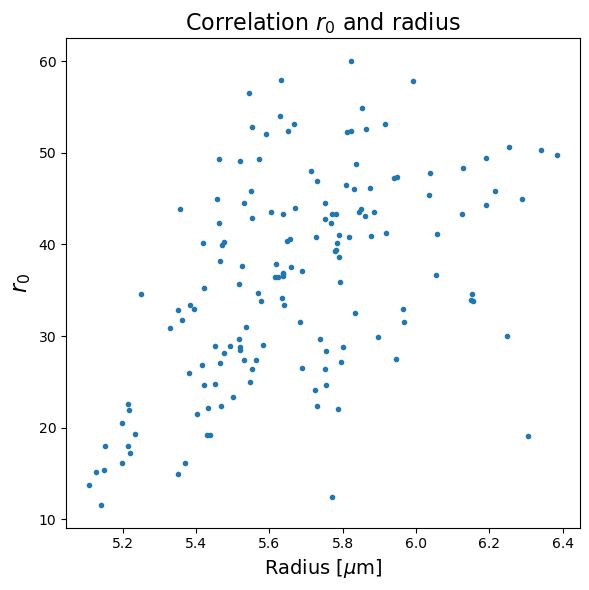

In [94]:
plt.figure(figsize=(6,6))
plt.plot(np.log(radius), r0,'.')

plt.title('Correlation $r_0$ and radius', fontsize=16)
plt.ylabel('$r_0$', fontsize=16)
plt.xlabel('Radius [$\mu$m]', fontsize=14)
plt.tight_layout()
plt.show()

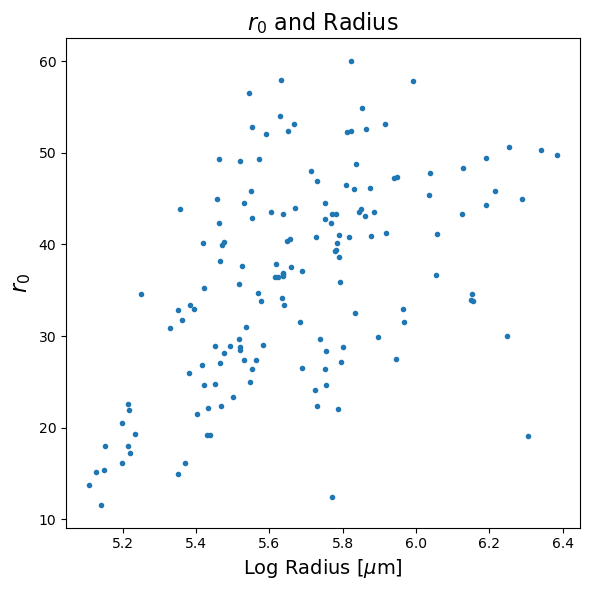

In [112]:
# Log-transform the radius
log_radius = np.log(radius)
#log_radius = radius

# Fit a line to the data (degree 1 for linear fit)
coefficients = np.polyfit(log_radius, r0, 1)
slope, intercept = coefficients

# Generate the fitted line
fitted_line = np.polyval(coefficients, log_radius)

# Plot the data points
plt.figure(figsize=(6,6))
plt.plot(log_radius, r0, '.', label='Data points')

# Plot the fitted line
#plt.plot(log_radius, fitted_line, 'k--', label='Fit $r_0$')

# Add title and labels
plt.title('$r_0$ and Radius', fontsize=16)
plt.ylabel('$r_0$', fontsize=16)
plt.xlabel('Log Radius [$\mu$m]', fontsize=14)
#plt.legend()
plt.tight_layout()
plt.savefig('r0_radius.png',dpi=300)
# Show the plot
plt.show()

In [114]:
r_squared = 1 - (np.sum((r0 - fitted_line) ** 2) / np.sum((r0 - np.mean(r0)) ** 2))
r_squared

0.2573771542447275

In [113]:
np.corrcoef(r0, log_radius)

array([[1.        , 0.50732352],
       [0.50732352, 1.        ]])